In [1]:
import os

data_root = '/home/commonfile/TCTAnnotatedData/TCTAnnotated20210331/Annotated202103TCTFK-XIMEA-1200-YX-BZ-1'
wsi_name = '6143430877H--209-G'
input_dir = os.path.join(data_root, wsi_name)
output_dir = 'output'

# 标注框绘制

In [2]:
vis_patch = '3_32'
vis_image = vis_patch + '.jpg'
vis_txt = vis_patch + '.txt'
vis_image_path = os.path.join(input_dir, vis_image)
vis_txt_path = os.path.join(input_dir, vis_txt)
print(vis_txt_path)
boxes = []
with open(vis_txt_path, 'r') as file:
    lines = file.readlines()
    lines = lines[1:]
    for line in lines:
        n, x, y, w, h = line.strip().split('\t')
        boxes.append((int(n), int(x), int(y), int(w), int(h)))
print(boxes)

/home/commonfile/TCTAnnotatedData/TCTAnnotated20210331/Annotated202103TCTFK-XIMEA-1200-YX-BZ-1/6143430877H--209-G/3_32.txt
[(2, 1439, 632, 206, 188), (4, 2949, 1685, 315, 559), (4, 2287, 2113, 281, 470)]


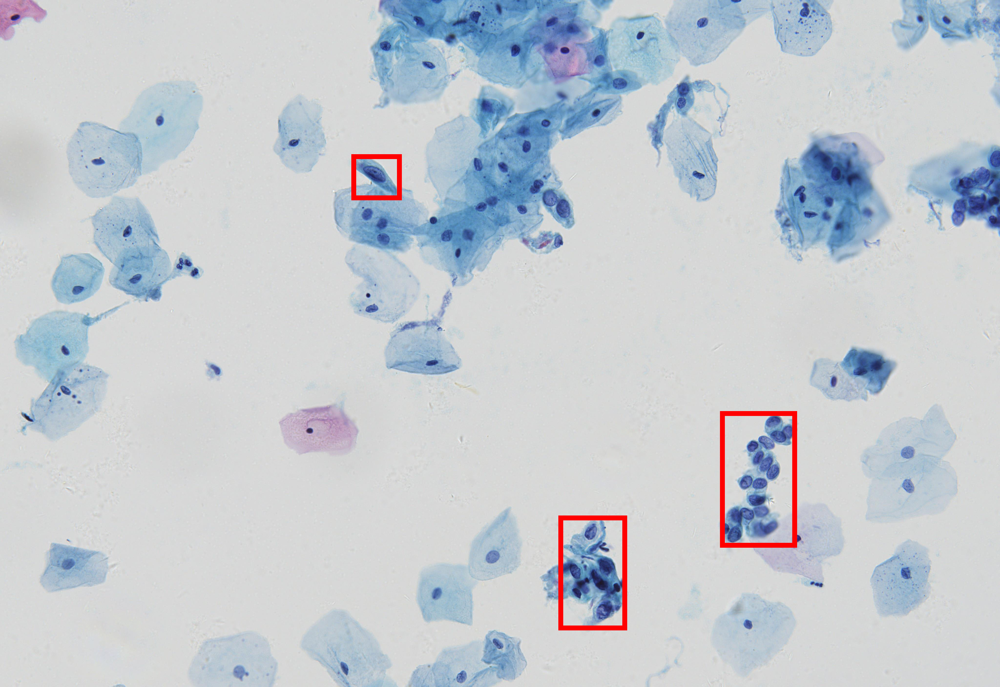

In [3]:
from PIL import Image, ImageDraw

# 打开图片
box_image = Image.open(vis_image_path)
draw = ImageDraw.Draw(box_image)

for box in boxes:
    n, x, y, w, h = box
    draw.rectangle((x, y, x+w, y+h), outline="red", width=20)
    
# 显示图片
box_image.show()

# Backbone可视化

In [144]:
import open_clip
import torch
import torch.nn.functional as F

model, preprocess_train, preprocess_val = open_clip.create_model_and_transforms('hf-hub:microsoft/BiomedCLIP-PubMedBERT_256-vit_base_patch16_224')
model = model.visual.trunk
model.norm = torch.nn.Identity()

In [148]:
model

VisionTransformer(
  (patch_embed): PatchEmbed(
    (proj): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
    (norm): Identity()
  )
  (pos_drop): Dropout(p=0.0, inplace=False)
  (patch_drop): Identity()
  (norm_pre): Identity()
  (blocks): Sequential(
    (0): Block(
      (norm1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
      (attn): Attention(
        (qkv): Linear(in_features=768, out_features=2304, bias=True)
        (q_norm): Identity()
        (k_norm): Identity()
        (attn_drop): Dropout(p=0.0, inplace=False)
        (proj): Linear(in_features=768, out_features=768, bias=True)
        (proj_drop): Dropout(p=0.0, inplace=False)
      )
      (ls1): Identity()
      (drop_path1): Identity()
      (norm2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
      (mlp): Mlp(
        (fc1): Linear(in_features=768, out_features=3072, bias=True)
        (act): GELU(approximate=none)
        (drop1): Dropout(p=0.0, inplace=False)
        (norm): Identity()


In [145]:
image = Image.open(vis_image_path)
image = image.resize((224,224))
image = preprocess_val(image).unsqueeze(0)
vis_feature = model.forward_features(image)
vis_feature = vis_feature.squeeze()
norm_feature = F.normalize(vis_feature, dim=-1)
norm_feature.shape

torch.Size([197, 768])

In [146]:
with torch.no_grad():
    vis_feature = vis_feature.squeeze()
    cls_token = vis_feature[0]
    patch_tokens = vis_feature[1:]
    patch_scores = patch_tokens @ cls_token
    patch_scores = patch_scores.softmax(dim=-1)

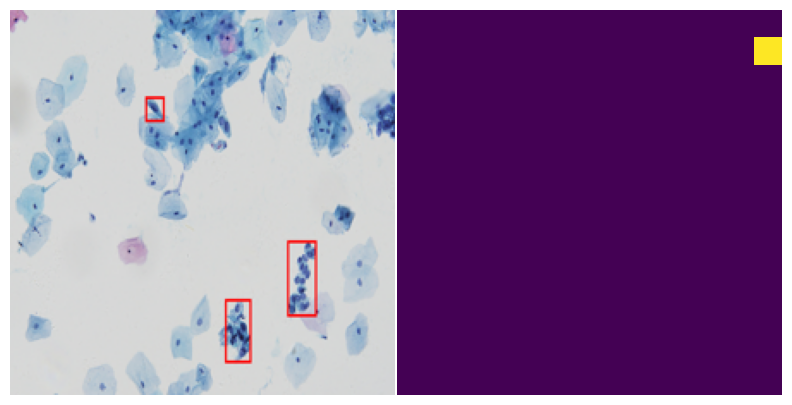

In [147]:
import matplotlib.pyplot as plt

fig = plt.figure(figsize=[10, 5], frameon=False)
ax = fig.add_subplot(1, 2, 1)
ax.axis("off")
ax.imshow(box_image.resize((224,224)))
ax = fig.add_subplot(1, 2, 2)
ax.axis("off")
ax.imshow(patch_scores.reshape(14,14).to('cpu'))
fig.subplots_adjust(hspace=0, wspace=0)

# Vis for ABMIL

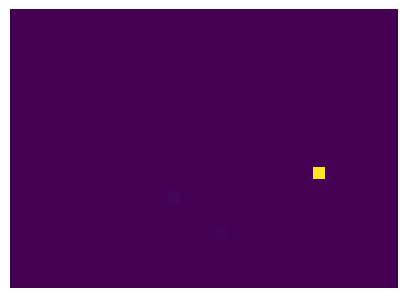

In [123]:
from modules.mhim import MHIM
import os
import numpy as np
import matplotlib.pyplot as plt

gc_data_root = '/home1/wsi/gc-224/POS'
feature_root = '/home/huangjialong/projects/BiomedCLIP-PUNCE/extract-features/result-final-gc-features/biomed2/pt'

wsi_name = '201217144235-6-5-HSIL'
wsi_path = os.path.join(gc_data_root, wsi_name)
feature_path = os.path.join(feature_root, wsi_name+'.pt')

feature = torch.load(feature_path)
feature.shape
abmil = MHIM(da_act='relu',baseline='attn', input_dim=768).eval()
pt_path = '/home/huangjialong/projects/BiomedCLIP-PUNCE/mil-methods/output-model/mil-methods/biomed2-abmil-gc-trainval/fold_0_model_best_auc.pt'

abmil.load_state_dict(torch.load(pt_path)['model'])

with torch.no_grad():
    y, attn_ab = abmil.forward_test(feature, return_attn=True)
attn_ab_norm = torch.softmax(attn_ab, -1)
fig = plt.figure(figsize=[10, 5], frameon=False)
# ax = fig.add_subplot(1, 2, 1)
# ax.axis("off")
# ax.imshow(box_image.resize((224,224)))
ax = fig.add_subplot(1, 2, 2)
ax.axis("off")
ax.imshow(attn_ab_norm.reshape(23,32).to('cpu'))
fig.subplots_adjust(hspace=0, wspace=0)

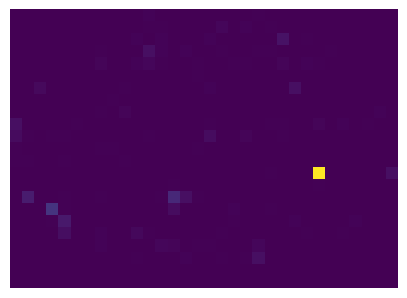

In [124]:
mask_cpt = torch.load('/home/huangjialong/projects/BiomedCLIP-PUNCE/mil-methods/output-model/mil-methods/biomed2-mhim(abmil)-gc-trainval/fold_0_model_best_auc.pt',map_location='cpu')
abmil.load_state_dict(mask_cpt['model'])

with torch.no_grad():
    y, attn_ab = abmil.forward_test(feature, return_attn=True)
attn_ab_norm = torch.softmax(attn_ab, -1)
fig = plt.figure(figsize=[10, 5], frameon=False)
# ax = fig.add_subplot(1, 2, 1)
# ax.axis("off")
# ax.imshow(box_image.resize((224,224)))
ax = fig.add_subplot(1, 2, 2)
ax.axis("off")
ax.imshow(attn_ab_norm.reshape(23,32).to('cpu'))
fig.subplots_adjust(hspace=0, wspace=0)


# Vis for TransMIL

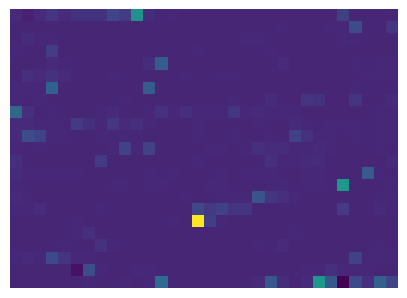

In [125]:
from modules.mhim import MHIM
import os
import numpy as np
import matplotlib.pyplot as plt


transmil = MHIM(da_act='relu',baseline='selfattn', input_dim=768).eval()
pt_path = '/home/huangjialong/projects/BiomedCLIP-PUNCE/mil-methods/output-model/mil-methods/biomed2-transmil-gc-trainval/fold_0_model_best_auc.pt'
transmil.load_state_dict(torch.load(pt_path)['model'])

with torch.no_grad():
    y, attn_tran = transmil.forward_test(feature.unsqueeze(0), return_attn=True)

attn_tran = attn_tran[1]
attn_tran = torch.mean(attn_tran, dim=1)
norm_attn_tran = torch.softmax(attn_tran, dim=-1)
fig = plt.figure(figsize=[10, 5], frameon=False)
# ax = fig.add_subplot(1, 2, 1)
# ax.axis("off")
# ax.imshow(box_image.resize((224,224)))
ax = fig.add_subplot(1, 2, 2)
ax.axis("off")
ax.imshow(norm_attn_tran.reshape(23,32).to('cpu'))
fig.subplots_adjust(hspace=0, wspace=0)

tensor([[0.0014, 0.0014, 0.0014, 0.0014, 0.0014, 0.0014, 0.0014, 0.0014, 0.0014,
         0.0014, 0.0014, 0.0014, 0.0014, 0.0014, 0.0014, 0.0014, 0.0014, 0.0014,
         0.0014, 0.0014, 0.0014, 0.0014, 0.0014, 0.0014, 0.0014, 0.0014, 0.0014,
         0.0014, 0.0014, 0.0014, 0.0014, 0.0014],
        [0.0014, 0.0014, 0.0014, 0.0014, 0.0014, 0.0014, 0.0014, 0.0014, 0.0014,
         0.0014, 0.0014, 0.0014, 0.0014, 0.0014, 0.0014, 0.0014, 0.0014, 0.0014,
         0.0014, 0.0014, 0.0014, 0.0014, 0.0014, 0.0014, 0.0014, 0.0014, 0.0014,
         0.0014, 0.0014, 0.0014, 0.0014, 0.0014],
        [0.0014, 0.0014, 0.0014, 0.0014, 0.0014, 0.0014, 0.0014, 0.0014, 0.0014,
         0.0014, 0.0014, 0.0014, 0.0014, 0.0014, 0.0014, 0.0014, 0.0014, 0.0014,
         0.0014, 0.0014, 0.0014, 0.0014, 0.0014, 0.0014, 0.0014, 0.0014, 0.0014,
         0.0014, 0.0014, 0.0014, 0.0014, 0.0014],
        [0.0014, 0.0014, 0.0014, 0.0014, 0.0014, 0.0014, 0.0014, 0.0014, 0.0014,
         0.0014, 0.0014, 0.0014, 0.0014,

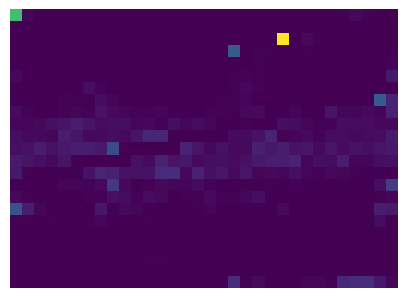

In [126]:
transmil = MHIM(da_act='relu',baseline='selfattn', input_dim=768).eval()
pt_path = '/home/huangjialong/projects/BiomedCLIP-PUNCE/mil-methods/output-model/mil-methods/biomed2-mhim(transmil)-gc-trainval/fold_0_model_best_auc.pt'
transmil.load_state_dict(torch.load(pt_path)['model'])

with torch.no_grad():
    y, attn_tran = transmil.forward_test(feature.unsqueeze(0), return_attn=True)

attn_tran = attn_tran[1]
attn_tran = torch.mean(attn_tran, dim=1)
norm_attn_tran = torch.softmax(attn_tran, dim=-1)
fig = plt.figure(figsize=[10, 5], frameon=False)
# ax = fig.add_subplot(1, 2, 1)
# ax.axis("off")
# ax.imshow(box_image.resize((224,224)))
ax = fig.add_subplot(1, 2, 2)
ax.axis("off")
ax.imshow(norm_attn_tran.reshape(23,32).to('cpu'))
fig.subplots_adjust(hspace=0, wspace=0)
norm_attn_tran.reshape(23,32)

# ROC曲线绘制

In [3]:
# 数据准备
import numpy as np
y = np.array([1, 1, 2, 2])
scores = np.array([0.1, 0.4, 0.35, 0.8])

# roc_curve的输入为
# y: 样本标签
# scores: 模型对样本属于正例的概率输出
# pos_label: 标记为正例的标签，本例中标记为2的即为正例
fpr, tpr, thresholds = metrics.roc_curve(y, scores, pos_label=2)
# 假阳性率
fpr
# 真阳性率
tpr
# 阈值
thresholds

# auc的输入为很简单，就是fpr, tpr值
auc
0.75


0.75

findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.


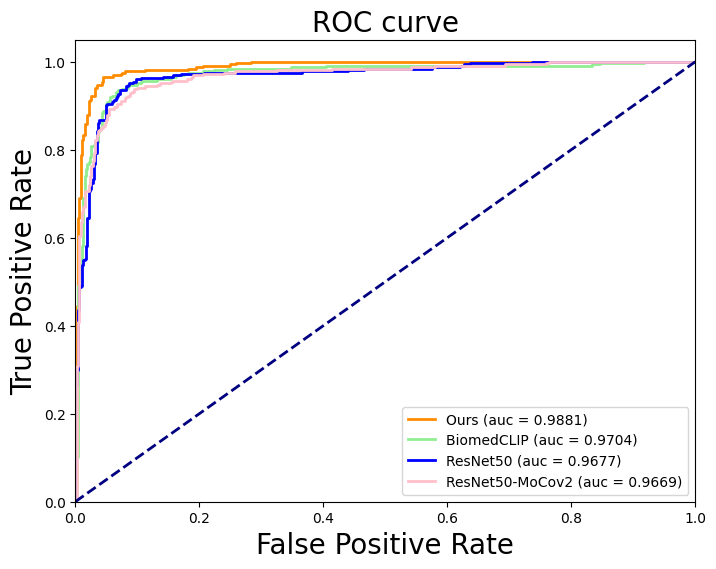

<Figure size 640x480 with 0 Axes>

In [3]:
import numpy as np
import os
import matplotlib.pyplot as plt

roc_root_dir = '/home/huangjialong/projects/BiomedCLIP-PUNCE/mil-methods/output_roc'
feat_dirs = ['biomed3', 'biomed1', 'resnet1', 'resnet50']
legends = ['Ours', 'BiomedCLIP', 'ResNet50', 'ResNet50-MoCov2']
fprs = []
tprs = []
colors = ['darkorange', 'lightgreen', 'blue', 'pink']
font = {'fontsize': 20, 'fontfamily': 'Times New Roman'}

plt.figure(figsize=(8,6))
lw = 2
for i, feat_dir in enumerate(feat_dirs):
    fpr = np.load(os.path.join(roc_root_dir, feat_dir, 'fpr.npy'))
    tpr = np.load(os.path.join(roc_root_dir, feat_dir, 'tpr.npy'))
    auc = np.load(os.path.join(roc_root_dir, feat_dir, 'auc.npy'))
    plt.plot(fpr, tpr, color=colors[i],
            lw=lw, label=f'{legends[i]} (auc = %0.4f)' % auc)
    
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate', fontdict=font)
plt.ylabel('True Positive Rate', fontdict=font)
plt.title('ROC curve', fontdict=font)
plt.legend(loc="lower right")
plt.show()
plt.savefig('roc_curve.png')


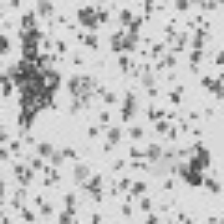

In [31]:
from torchvision import transforms
from PIL import Image

def get_color_distortion(s=0.5):  # 0.5 for CIFAR10 by default
    # s is the strength of color distortion
    color_jitter = transforms.ColorJitter(0.8*s, 0.8*s, 0.8*s, 0.2*s)
    rnd_color_jitter = transforms.RandomApply([color_jitter], p=0.8)
    rnd_gray = transforms.RandomGrayscale(p=0.2)
    color_distort = transforms.Compose([rnd_gray])
    return color_distort

train_transform = transforms.Compose([transforms.RandomResizedCrop(224),
                                          transforms.RandomHorizontalFlip(p=0.5),
                                          get_color_distortion(s=0.5),
                                          ])

input_img = 'img.jpg'
img = Image.open(input_img)
img1 = train_transform(img)
img2 = train_transform(img)
img2